# Plot different surfaces & YEO networks | colormaps

In [1]:
# Set the environment
import os
import numpy as np
import matplotlib as plt
import nibabel as nb
from nibabel.freesurfer.mghformat import load
from brainspace.plotting import plot_hemispheres
from brainspace.mesh.mesh_io import read_surface
from brainspace.datasets import load_conte69
from brainspace.datasets.base import load_mask
from brainspace.gradient import GradientMaps
from brainspace.utils.parcellation import map_to_labels
from brainspace.mesh.array_operations import smooth_array
import matplotlib.pyplot as mpl
import seaborn as sns


# Set the working directory to the 'out' directory
os.chdir("/data_/mica3/BIDS_MICs/") 

# This variable will be different for each subject
derivatives='/data_/mica3/BIDS_MICs/derivatives'
out=derivatives+ '/micapipe_v0.2.0/'
recon='freesurfer'
sub='sub-PX072'
subjectID=sub+'_ses-01'
subjectDir=out + sub+'/ses-01'

# Here we define the atlas
atlas='schaefer-400'

# Set paths and variables
dir_FS = derivatives+'/'+recon+'/' + subjectID
dir_FSraw = derivatives+'/'+recon+'/' + subjectID

# Load native pial surface
surf_lh = read_surface(dir_FS+'/surf/lh.pial', itype='fs')
surf_rh = read_surface(dir_FS+'/surf/rh.pial', itype='fs')

# Load native white matter surface
wm_lh = read_surface(dir_FS+'/surf/lh.white', itype='fs')
wm_rh = read_surface(dir_FS+'/surf/rh.white', itype='fs')

# Load native inflated surface
inf_lh = read_surface(dir_FS+'/surf/lh.inflated', itype='fs')
inf_rh = read_surface(dir_FS+'/surf/rh.inflated', itype='fs')

# Load conte69
c69_lh, c69_rh = load_conte69()

# Read label for conte69
micapipe='/data_/mica1/01_programs/micapipe-v0.2.0'
labels_c69 = np.loadtxt(open(micapipe + '/parcellations/' + atlas + '_conte69.csv'), dtype=int)

# mask of the medial wall
mask_c69 = load_mask(join=True)

# Load annotation file in fsaverage5
annot_lh_fs5= nb.freesurfer.read_annot(micapipe + '/parcellations/lh.'+atlas+'_mics.annot')
Ndim = max(np.unique(annot_lh_fs5[0]))
annot_rh_fs5= nb.freesurfer.read_annot(micapipe + '/parcellations/rh.'+atlas+'_mics.annot')[0]+Ndim

# fsaverage5
fs5_lh = read_surface(micapipe+'/surfaces/fsaverage5/surf/lh.pial', itype='fs')
fs5_rh = read_surface(micapipe+'/surfaces/fsaverage5/surf/rh.pial', itype='fs')
fs5_lhi = read_surface(micapipe+'/surfaces/fsaverage5/surf/lh.inflated', itype='fs')
fs5_rhi = read_surface(micapipe+'/surfaces/fsaverage5/surf/rh.inflated', itype='fs')

# fsLR-32k
c69_lh = read_surface(micapipe + '/surfaces/fsLR-32k.L.surf.gii', itype='gii')
c69_rh = read_surface(micapipe + '/surfaces/fsLR-32k.R.surf.gii', itype='gii')
c69_lhi = read_surface(micapipe + '/surfaces/fsLR-32k.L.inflated.surf.gii', itype='gii')
c69_rhi = read_surface(micapipe + '/surfaces/fsLR-32k.R.inflated.surf.gii', itype='gii')

# fsLR-5k
c5k_lh = read_surface(micapipe + '/surfaces/fsLR-5k.L.surf.gii', itype='gii')
c5k_rh = read_surface(micapipe + '/surfaces/fsLR-5k.R.surf.gii', itype='gii')
c5k_lhi = read_surface(micapipe + '/surfaces/fsLR-5k.L.inflated.surf.gii', itype='gii')
c5k_rhi = read_surface(micapipe + '/surfaces/fsLR-5k.R.inflated.surf.gii', itype='gii')

# Colormap
ColCurv= plt.colors.ListedColormap(['#A2CD5A', '#A0CA5B', '#9FC85C', '#9EC55D', '#9DC35E', '#9CC05F', '#9BBE61', '#9ABB62', '#99B963', '#98B664', '#96B465', '#95B166', '#94AF68', '#93AC69', '#92AA6A', '#91A76B', '#90A56C', '#8FA26D', '#8EA06F', '#8C9D70', '#8B9B71', '#8A9972', '#899673', '#889475', '#879176', '#868F77', '#858C78', '#848A79', '#82877A', '#81857C', '#80827D', '#7F807E', '#807D7D', '#827A7A', '#857777', '#877575', '#8A7272', '#8C6F6F', '#8F6C6C', '#916969', '#946666', '#966464', '#996161', '#9B5E5E', '#9D5B5B', '#A05858', '#A25656', '#A55353', '#A75050', '#AA4D4D', '#AC4A4A', '#AF4747', '#B14545', '#B44242', '#B63F3F', '#B93C3C', '#BB3939', '#BE3636', '#C03434', '#C33131', '#C52E2E', '#C82B2B', '#CA2828', '#CD2626'])
grey = plt.colors.ListedColormap(np.full((256, 4), [0.65, 0.65, 0.65, 1]))

In [2]:
# Smooth intencities
def smooth_surf(surf_l, surf_r, points, Mask, Kernel='uniform', Niter=3, Relax=0.35):
    '''
    This function smooth an array (left and right) on a given surface
    Parameters
    ----------
    surf_l : np.array left surface 
    surf_r : np.array right surface
    points : np.array surface data
    Kernel : {'uniform', 'gaussian', 'inverse_distance'}
    Niter  : int, optional Number of smooth iterations
    Relax  : relax : float, optional relaxation factor
    Mask   : str or 1D ndarray, optional
    Returns
    -------
    sdata : smoothed numpy array
    
    '''
    Ndim = Mask.shape[0] 
    n2dim = int(Ndim/2)
    Mask_l=Mask[0:n2dim]
    Mask_r=Mask[n2dim:Ndim]
    sdata = np.concatenate((smooth_array(surf_l, points[0:n2dim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_l), 
                          smooth_array(surf_r, points[n2dim:Ndim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_r)), axis=0)
    return(sdata)

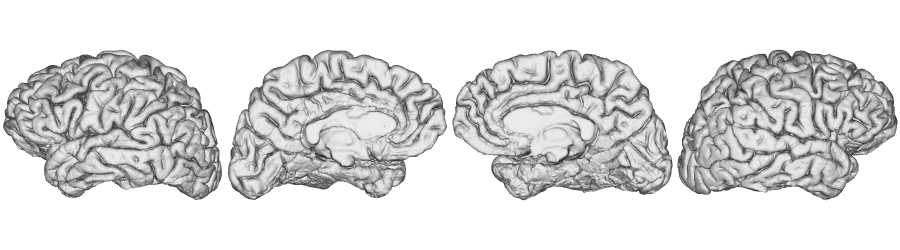

In [3]:
# Plot the surface
plot_hemispheres(surf_lh, surf_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_native.png')

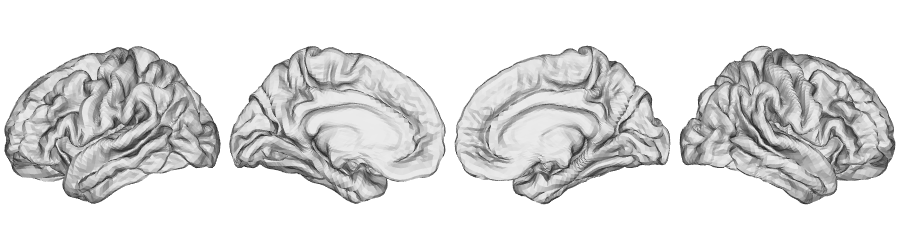

In [4]:
# Plot the surface
plot_hemispheres(fs5_lh, fs5_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_fsaverage5.png')

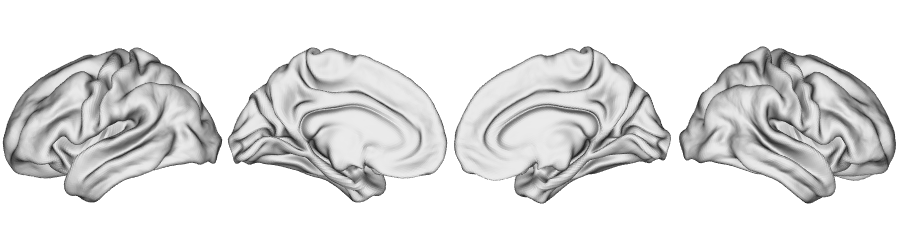

In [5]:
# Plot the surface
plot_hemispheres(c69_lh, c69_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_c69.png')

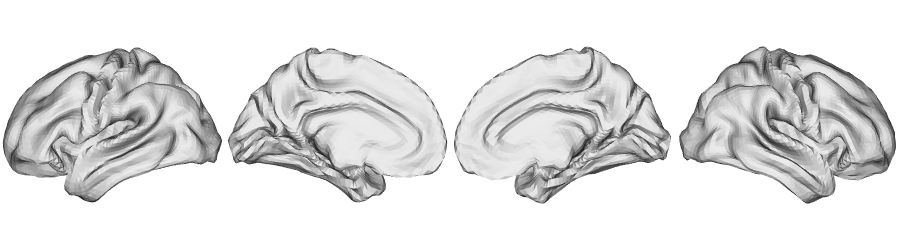

In [6]:
# Plot the surface
plot_hemispheres(c5k_lh, c5k_rh, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_fsLR5k.png')

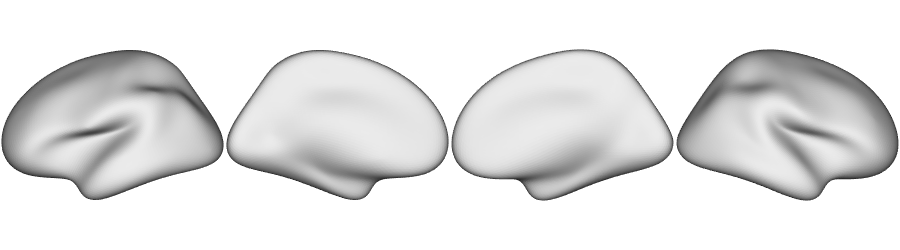

In [7]:
# Plot the surface
plot_hemispheres(fs5_lhi, fs5_rhi, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_fsaverage5-inflated.png')

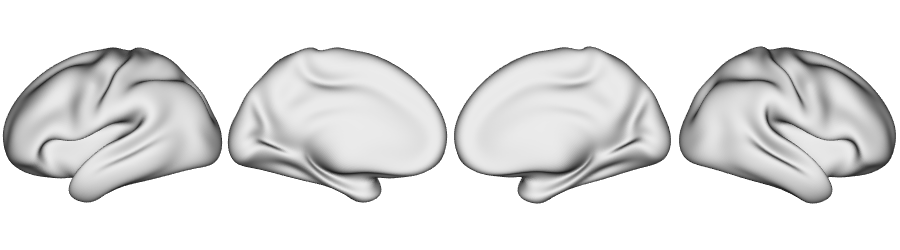

In [8]:
# Plot the surface
plot_hemispheres(c69_lhi, c69_rhi, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_fsLR-32k-inflated.png')

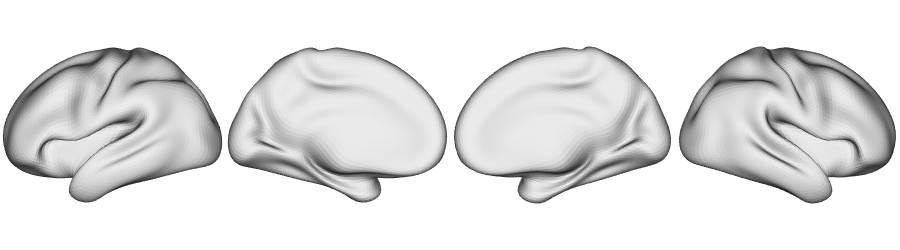

In [9]:
# Plot the surface
plot_hemispheres(c5k_lhi, c5k_rhi, size=(900, 250), zoom=1.25, embed_nb=True, interactive=False, share='both',
                 nan_color=(0, 0, 0, 1), color_range=(1.5, 4), transparent_bg=False,
                screenshot=False, filename='/home/bic/rcruces/Desktop/surf_fsLR-5k-inflated.png')

# YEO networks

In [10]:
# Load the cortical connectome
funcAcq='desc-se_task-rest_acq-AP_bold'
mtx_fs = nb.load(f'{subjectDir}/func/{funcAcq}/surf/{subjectID}_surf-fsLR-32k_atlas-{atlas}_desc-FC.shape.gii').darrays[0].data

# slice the matrix
FC = mtx_fs[49:, 49:]
#FC = np.delete(np.delete(FC, 200, axis=0), 200, axis=1)

# Fischer transformation
FCz = np.arctanh(FC)

# replace inf with 0
FCz[~np.isfinite(FCz)] = 0

# Mirror the matrix
FCz = np.triu(FCz,1)+FCz.T

# Load annotations
lh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/lh.' + atlas + '_mics.annot')
rh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/rh.' + atlas + '_mics.annot')
labs = lh_lab[2][1:] + rh_lab[2][1:]

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_21554/229604026.py:10: RuntimeWarning: divide by zero encountered in arctanh
  FCz = np.arctanh(FC)


0 Vis
1 SomMot
2 Default
3 SalVentAttn
4 DorsAttn
5 Cont
6 Limbic


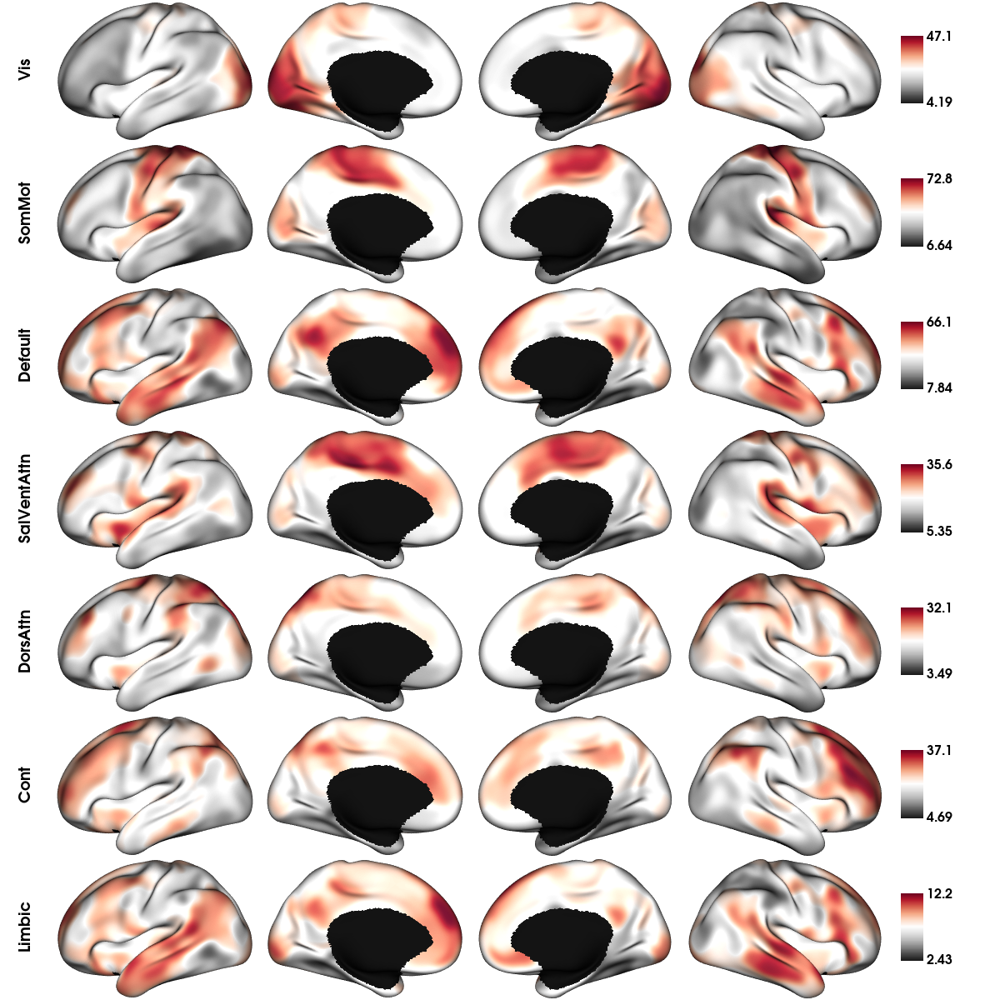

In [11]:
# Load annotations
lh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/lh.' + atlas + '_mics.annot')
rh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/rh.' + atlas + '_mics.annot')
labs = lh_lab[2][1:] + rh_lab[2][1:]

# Plot each YEO network
netStrs = ['Vis', 'SomMot', 'Default', 'SalVentAttn', 'DorsAttn', 'Cont', 'Limbic' ]
networks = [None] * len(netStrs)

# Positive correlations
fc_pos = np.copy(FCz)
fc_pos[(0>fc_pos)] = 0

for i, netNom in enumerate(netStrs):
    print(str(i) + ' ' + netNom)
    indx = [netNom in str(x) for x in labs]
    net = np.sum(fc_pos[indx,:], axis=0)
    networks[i] = map_to_labels(net, labels_c69, fill=np.nan, mask=mask_c69)
    networks[i] = smooth_surf(c69_lhi, c69_rhi, networks[i], mask_c69, Kernel='gaussian', Niter=20,Relax=0.8)
    del(net)
    
# YEO networks
plot_hemispheres(c69_lhi, c69_rhi, array_name=networks, size=(1200, 1200), cmap='RdGy_r',
                 embed_nb=True,  label_text={'left':netStrs}, color_bar='right',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False, filename='/home/bic/rcruces/Desktop/FC_yeo-sumpos.png')

# Colormaps !!! 
Check this out https://pratiman-91.github.io/colormaps/

# seaborn

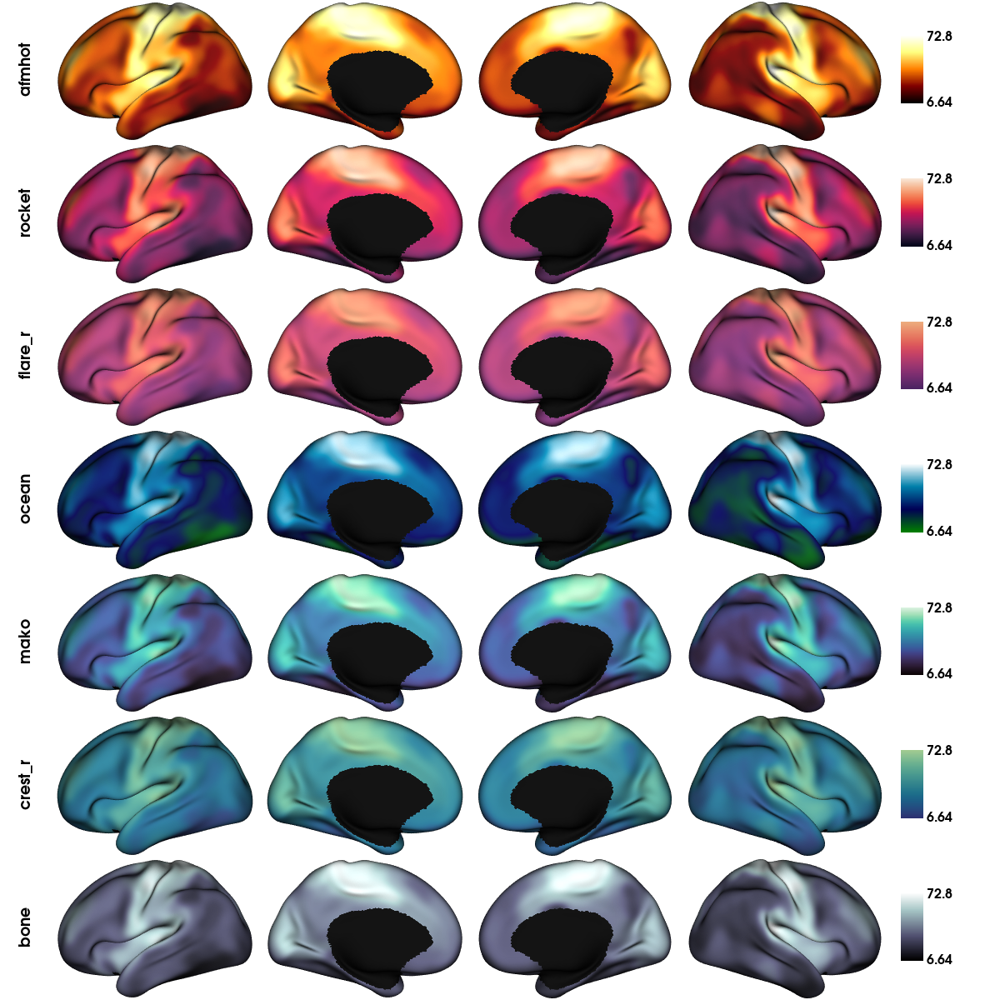

In [12]:
# colormaps as list for brainspace array
netSomMot=[None] * 7
for i in range(7):
    netSomMot[i] = networks[1]
cmp1 = ['afmhot', 'rocket', 'flare_r', 'ocean', 'mako','crest_r', 'bone']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot, size=(1200, 1200), cmap=cmp1,
                 embed_nb=True, label_text={'left':cmp1}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

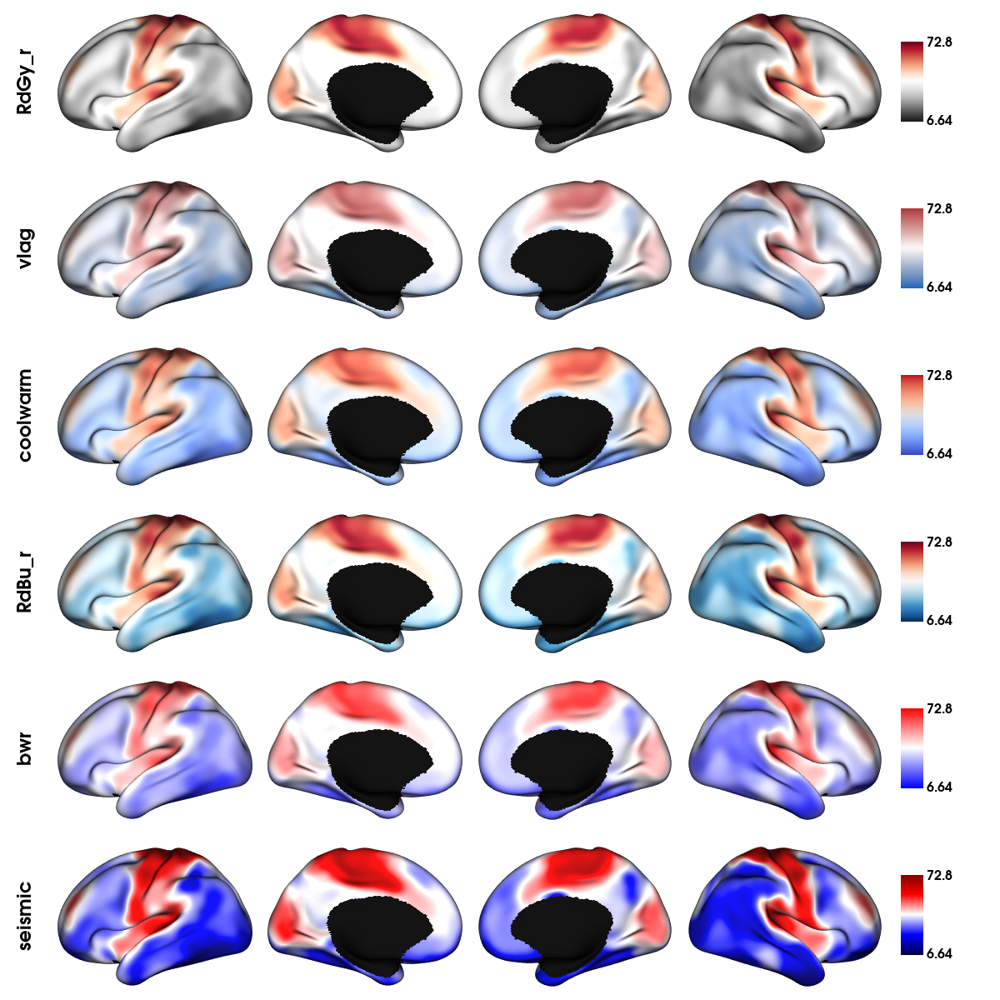

In [13]:
cmp3 = ['RdGy_r','vlag','coolwarm', 'RdBu_r', 'bwr','seismic']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:6], size=(1200, 1200), cmap=cmp3,
                 embed_nb=True, label_text={'left':cmp3}, color_bar='right', color_range='sym',
                 zoom=1.5, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

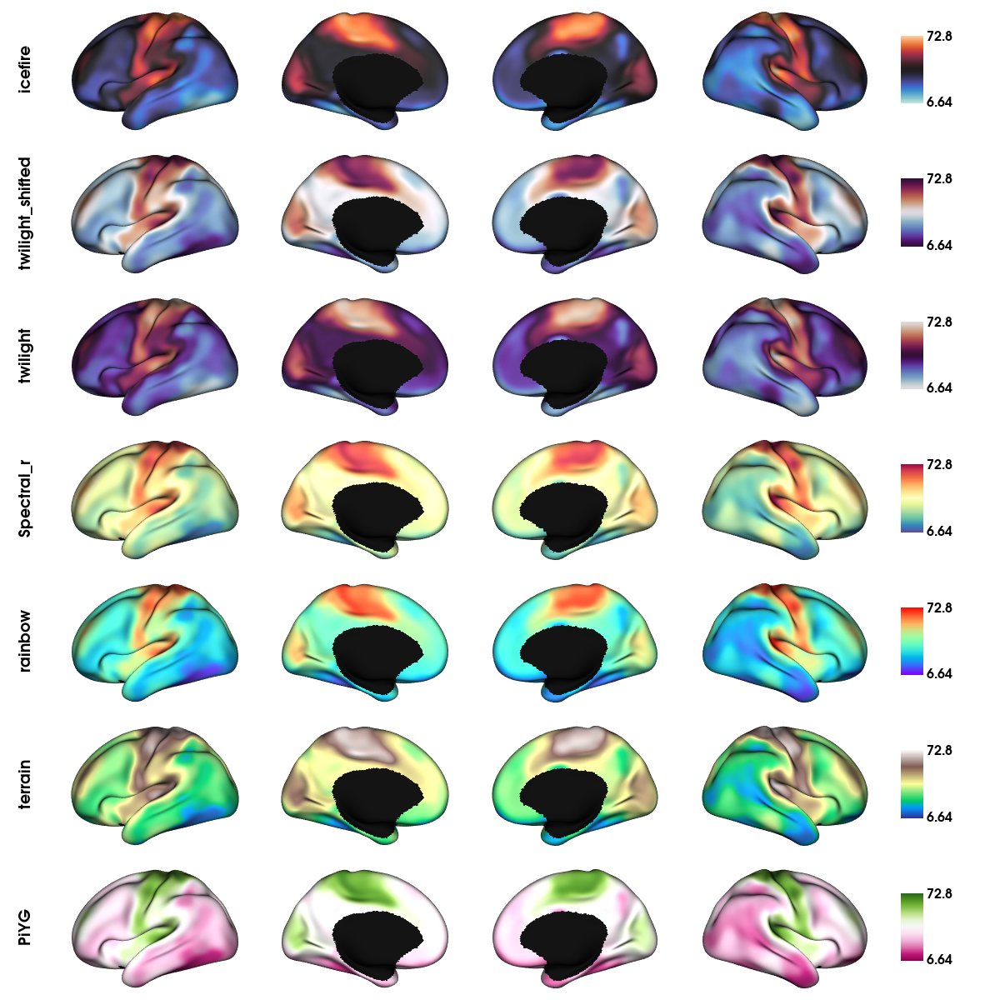

In [14]:
cmpbi = ['icefire', 'twilight_shifted', 'twilight', 'Spectral_r', 'rainbow','terrain','PiYG']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot, size=(1200, 1200), cmap=cmpbi,
                 embed_nb=True, label_text={'left':cmpbi}, color_bar='right', color_range='sym',
                 zoom=1.5, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

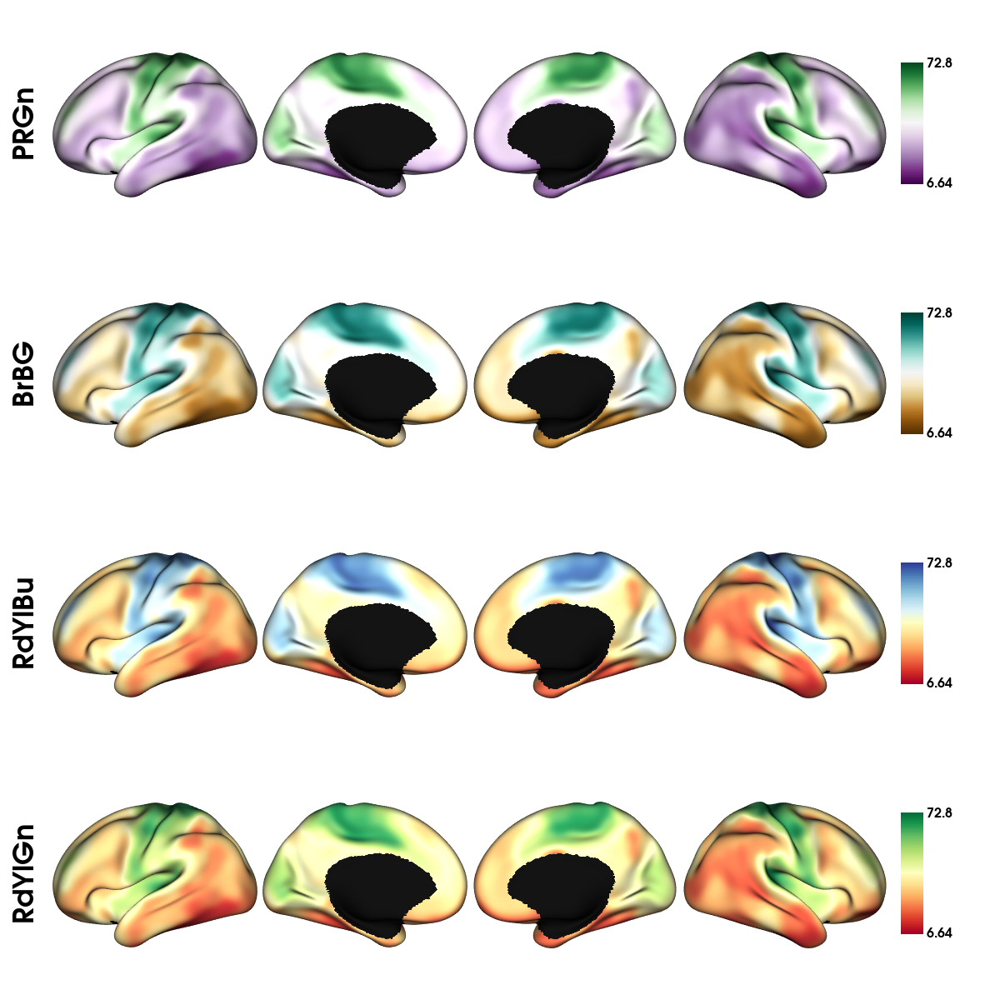

In [15]:
cmpbi = ['PRGn', 'BrBG', 'RdYlBu', 'RdYlGn']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:4], size=(1200, 1200), cmap=cmpbi,
                 embed_nb=True, label_text={'left':cmpbi}, color_bar='right', color_range='sym',
                 zoom=1.25, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

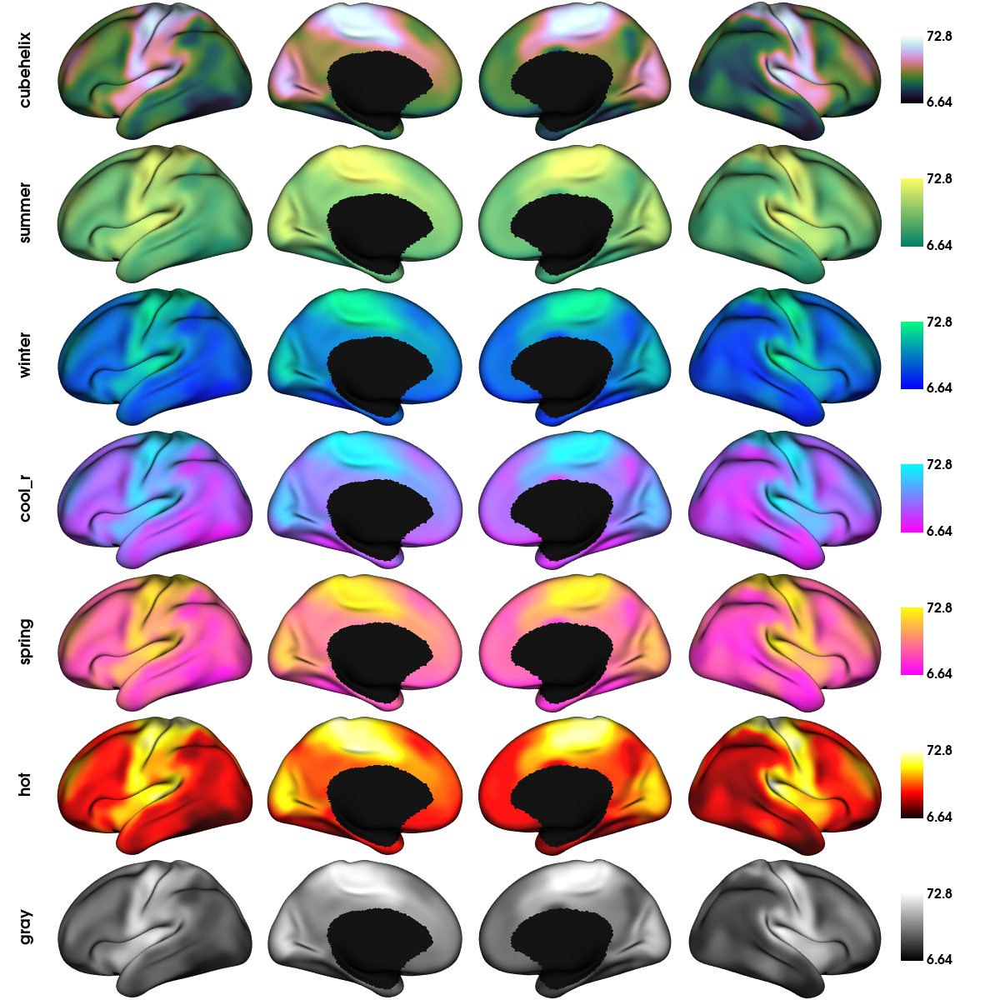

In [16]:
cmp4 = ['cubehelix', 'summer','winter', 'cool_r', 'spring', 'hot', 'gray' ]
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot, size=(1200, 1200), cmap=cmp4,
                 embed_nb=True, label_text={'left':cmp4}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

# viridis

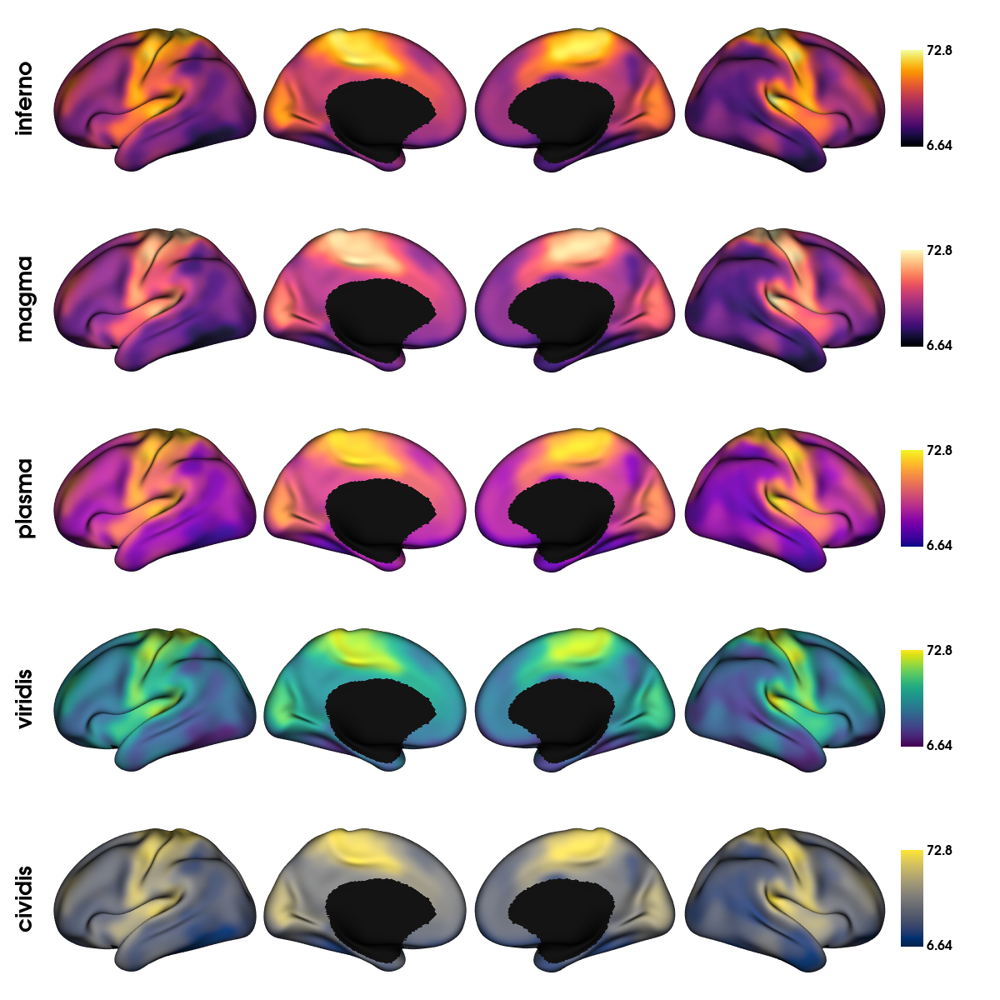

In [17]:
cmp5 = ['inferno', 'magma', 'plasma', 'viridis', 'cividis']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:5], size=(1200, 1200), cmap=cmp5,
                 embed_nb=True, label_text={'left':cmp5}, color_bar='right', color_range='sym',
                 zoom=1.3, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

# cmocean

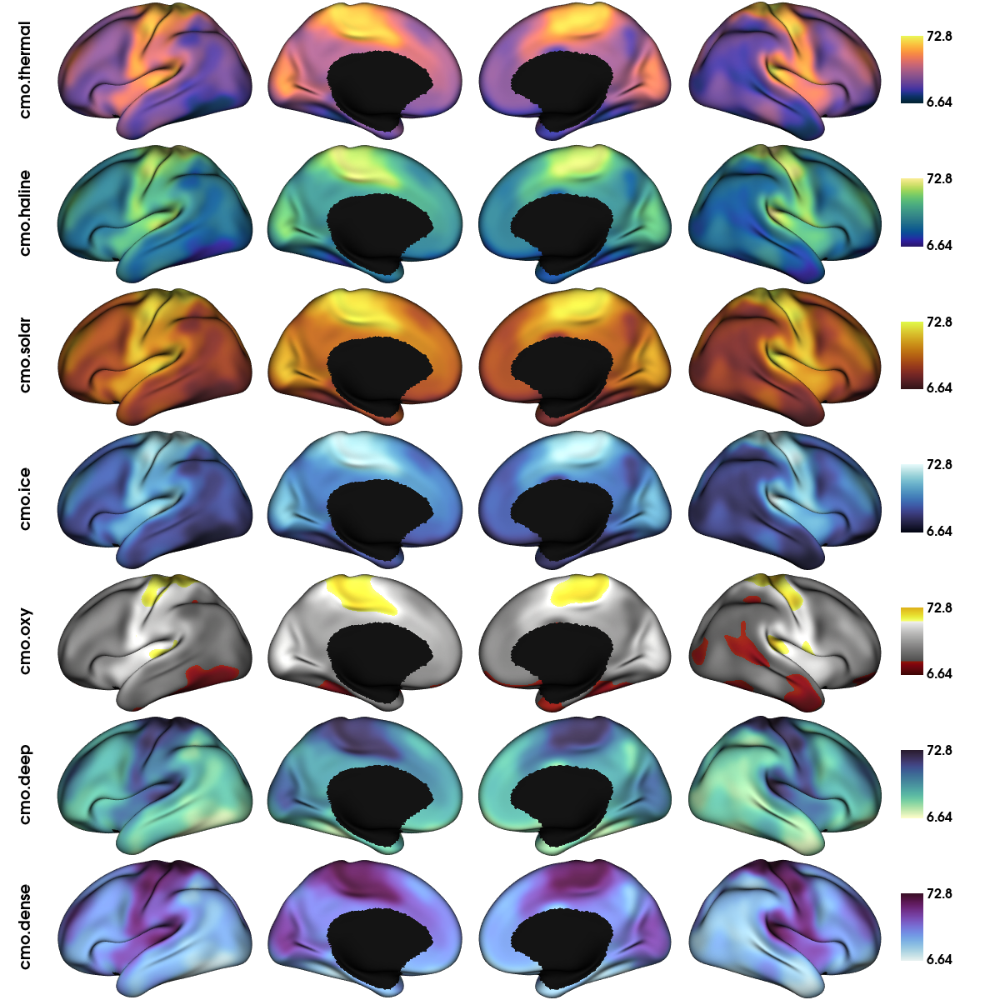

In [18]:
import cmocean
cmaps = cmocean.cm.cmap_d
cmp5 = ['cmo.thermal', 'cmo.haline', 'cmo.solar', 'cmo.ice', 'cmo.oxy', 'cmo.deep','cmo.dense']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot, size=(1200, 1200), cmap=cmp5,
                 embed_nb=True, label_text={'left':cmp5}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

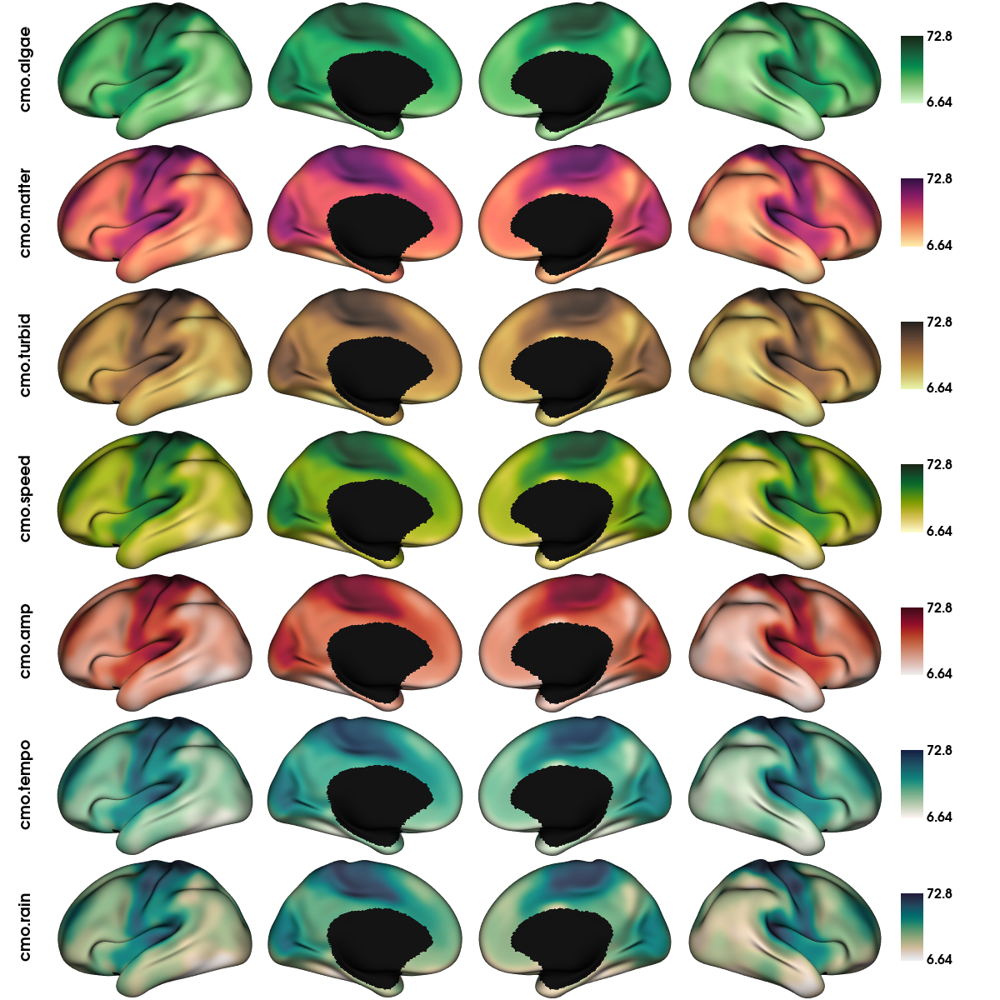

In [20]:
cmp5 = ['cmo.algae', 'cmo.matter', 'cmo.turbid', 'cmo.speed', 'cmo.amp', 'cmo.tempo','cmo.rain']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot, size=(1200, 1200), cmap=cmp5,
                 embed_nb=True, label_text={'left':cmp5}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

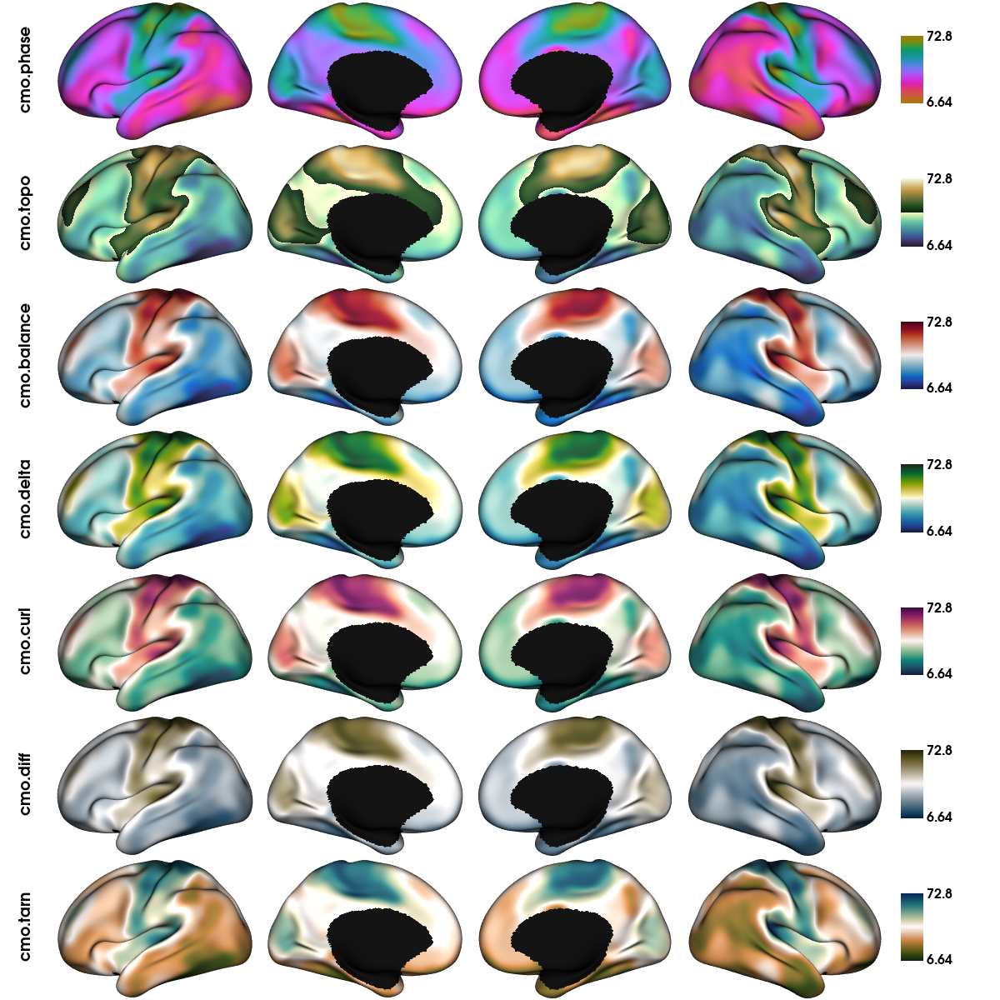

In [21]:
cmp5 = ['cmo.phase', 'cmo.topo', 'cmo.balance', 'cmo.delta', 'cmo.curl', 'cmo.diff','cmo.tarn']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot, size=(1200, 1200), cmap=cmp5,
                 embed_nb=True, label_text={'left':cmp5}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

# proplot
https://proplot.readthedocs.io/en/latest/colormaps.html 

In [22]:
import proplot as pplt

/host/yeatman/local_raid/rcruces/anaconda3/lib/python3.9/site-packages/proplot/__init__.py:71: ProplotWarning: Rebuilding font cache. This usually happens after installing or updating proplot.
  register_fonts(default=True)


# colormaps
https://pratiman-91.github.io/colormaps/

In [65]:
import colormaps

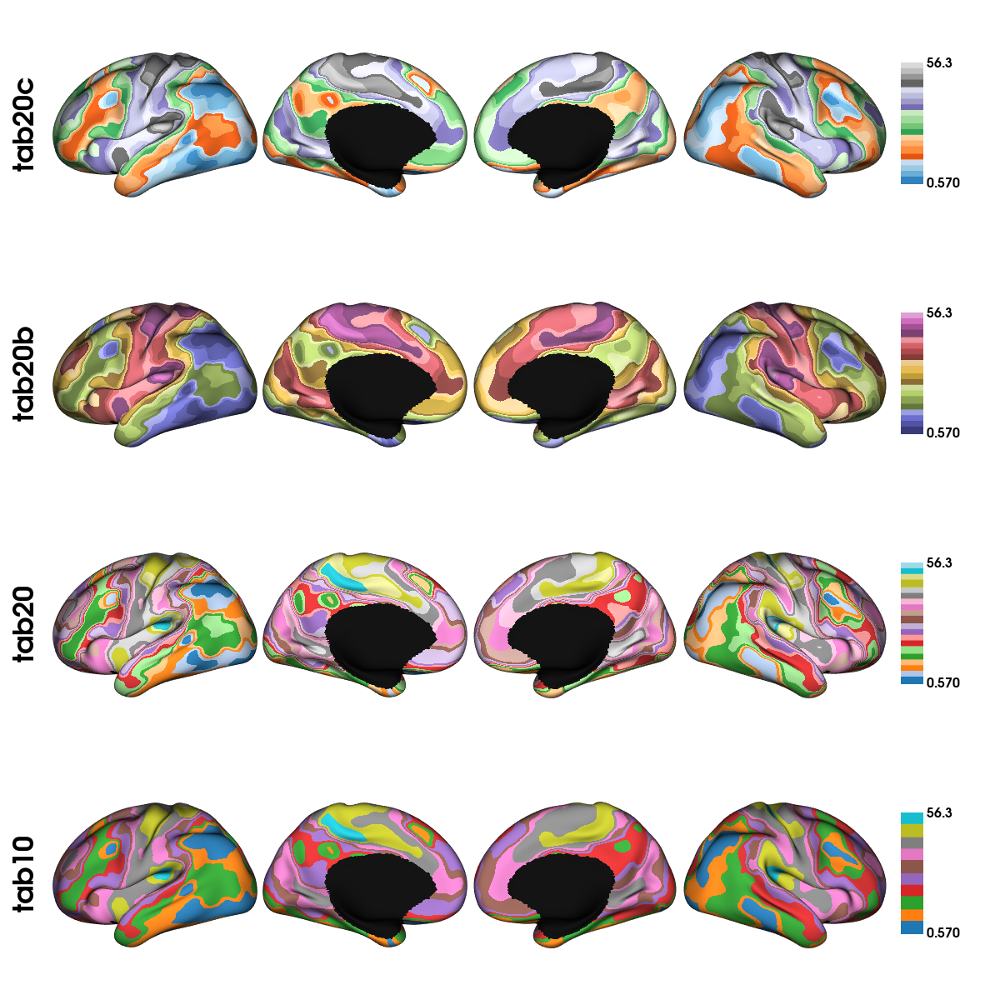

In [14]:
cmp6 = ['tab20c', 'tab20b', 'tab20', 'tab10']
plot_hemispheres(inf_lh, inf_rh, array_name=netSomMot[0:4], size=(1200, 1200), cmap=cmp6,
                 embed_nb=True, label_text={'left':cmp6}, color_bar='right', color_range='sym',
                 zoom=1.25, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)